# Spotify API Data

Now that I've pulled data on the ~18k albums that have been reviewed on Pitchfork and Last.fm, I can find more info about those albums on Spotify by querying the Spotify API via the Spotipy module to continually refresh my API token that I received when I registered my app with Spotify. I used [this Medium article](https://towardsdatascience.com/get-your-spotify-streaming-history-with-python-d5a208bbcbd3) as a guide for how to set that up.  

In [2]:
# munging data
import pandas as pd
import numpy as np

# pulling data from api
import requests
from credentials import token    # this is a program i wrote that includes my api credentials

# EDA and visualization
import seaborn as sns 
import matplotlib as plt

In [2]:
# checking token

print(token)

BQB6ajk9d6V_Rn5bFzEuVKoiaLPYIspVgtDO4sxhHd8bmW8mE4tGm5RGVZQlTkVCvA2xI3dLcJfxAw580uBYKDSdMCL68OMeuFTcRHSfKJp_n33o6U2ytoJ_GP44XWmAARIzdmYHR_TN3vJ-_zTFa3TH


## Geting spotify IDs for albums reviewed by Pitchfork

In [3]:
def get_info(q, token, type = 'album', query = 'id'):
    headers = {
    'Accept': 'application/json',
    'Content-Type': 'application/json',
    'Authorization': f'Bearer ' + token,
    }
    params = [
        ('q', q),
        ('type', type),
        ('market', 'US')
    ]
    json_key = str(type + 's')
    try: 
        response = requests.get('https://api.spotify.com/v1/search',
                           headers = headers, params = params, timeout = 5)
        json = response.json()
        first_result = json[json_key]['items'][0][query]
        return first_result
    except:
        return "None Found"

In [4]:
# Testing q_list with short list

QQ_list = ['Pure Glass, Sahara', 'Impossible Bouquet, Absolutely Yours']

get_info(QQ_list, token)

'1XR3yxUwk97Cd74Y0QMWuS'

In [5]:
# full q_list

pitchfork_df = pd.read_csv('data/pitchfork_data_clean.csv', index_col = 0)
q_list = pitchfork_df.api_formatted.to_list()

In [6]:
len(q_list)

18389

In [13]:
# calling function to get album ids

# album_ids = pd.DataFrame([q_list, [get_info(i, token) for i in q_list]]).T

In [51]:
# renaming cols in df
#album_ids.columns = ['album_artist', 'album_id']

In [33]:
album_ids.head()

,Unnamed: 0,album_artist,album_id
0,0,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP
1,1,"pure tone audiometry, aarktica",1m3R12XogJueABamg8tSgH
2,2,or you could just go through your whole life a...,1h1zIiRM0ovL6HSjb1A1qy
3,3,"bleeding light, aarktica",1PgyPnEPQsSlKOym7Iyur0
4,4,"abcs, abcs",6rCjDiEoMBCmam5ahcoJCb


In [34]:
# total number of albums searched
len(album_ids)

18389

In [35]:
# 4198 rows where no album found on spotify 

len(album_ids[album_ids.album_id=="None Found"])

4198

In [36]:
# saving album ids as a csv

album_ids.to_csv('data/spotify_albums_ids.csv')

## Get Artist Genre Data

In [10]:
album_ids = pd.read_csv('data/spotify_albums_ids.csv')

album_title = pitchfork_df.album_title
artist_name = pitchfork_df.artist

In [11]:
def get_artist_id(q, token):
    headers = {
    'Accept': 'application/json',
    'Content-Type': 'application/json',
    'Authorization': f'Bearer ' + token,
    }
    params = [
        ('q', q),
        ('type', 'artist'),
        ('market', 'US')
    ]
    try: 
        response = requests.get('https://api.spotify.com/v1/search',
                           headers = headers, params = params, timeout = 5)
        json = response.json()
        first_result = json['artists']['items'][0]['genres']
        return first_result
    except:
        return "None Found"

In [21]:
album_genre = pd.concat([album_ids, pd.Series([get_info(i, token, type = 'artist', query = 'genres') 
                                 for i in artist_name]).rename('genre', inplace = True)], axis = 1)

In [22]:
album_genre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18389 entries, 0 to 18388
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Unnamed: 0    18389 non-null  int64 
 1   Unnamed: 0.1  18389 non-null  int64 
 2   album_artist  18389 non-null  object
 3   album_id      18389 non-null  object
 4   genre         18389 non-null  object
dtypes: int64(2), object(3)
memory usage: 718.4+ KB


In [23]:
# This drops all instances where the album from Metacritic is not on Spotify, as well as 
# instances when the same album shows up twice. 

album_genre = album_genre[album_genre.album_id != 'None Found'].drop_duplicates(subset = 'album_id').reset_index(drop = True)

In [24]:
album_genre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14086 entries, 0 to 14085
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Unnamed: 0    14086 non-null  int64 
 1   Unnamed: 0.1  14086 non-null  int64 
 2   album_artist  14086 non-null  object
 3   album_id      14086 non-null  object
 4   genre         14086 non-null  object
dtypes: int64(2), object(3)
memory usage: 550.4+ KB


In [25]:
# saving album ids as a csv

album_genre.to_csv('data/spotify_genres.csv')

## Getting list of individual tracks for each album

In [6]:
album_genre = pd.read_csv('data/spotify_genres.csv')

In [7]:
album_genre.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,album_artist,album_id,genre
0,0,0,0,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie']
1,1,1,1,"pure tone audiometry, aarktica",1m3R12XogJueABamg8tSgH,[]
2,2,2,2,or you could just go through your whole life a...,1h1zIiRM0ovL6HSjb1A1qy,[]
3,3,3,3,"bleeding light, aarktica",1PgyPnEPQsSlKOym7Iyur0,[]
4,4,4,4,"abcs, abcs",6rCjDiEoMBCmam5ahcoJCb,"['alternative hip hop', 'conscious hip hop', '..."


In [8]:
def get_tracklist(album_id, token):
    headers = {
        'Accept': 'application/json',
        'Content-Type': 'application/json',
        'Authorization': f'Bearer ' + token}
    get_url = 'https://api.spotify.com/v1/albums/' + album_id + '/tracks'
    
    response = requests.get(get_url, headers=headers, params=None)
    json = response.json()
    #print(json)
    first_result = []
    album_id_list = []
    for i in json['items']:
            first_result.append(i['id'])
            album_id_list.append(album_id)
    return pd.DataFrame(list(zip(album_id_list, first_result)), columns = ['album_id', 'track_id'])

In [9]:
validalbum_trackid = pd.concat([get_tracklist(i, token)  for i in album_genre['album_id']])

In [10]:
album_track_df = album_genre.merge(validalbum_trackid, how = 'inner', on = 'album_id')

In [21]:
album_track_df.drop(['Unnamed: 0'], axis=1, inplace=True)

In [16]:
album_track_df.sample(3)

,Unnamed: 0,album_artist,album_id,genre,track_id
52200,52200,"and what have you done with my body god?, art ...",2fxrT2qpr4zqwoJG9becvH,"['dance rock', 'new romantic', 'new wave', 'ne...",06Iio8kY21Cvzt6sRJXYVI
55591,55591,"vegas: live, frank sinatra",4qCD9ztKqoKkm0yakpt3nZ,"['adult standards', 'easy listening', 'lounge']",4JGrZa6xiP04OuviycA732
101930,101930,"well spent youth, isole",1YZMboacnrmLsp2neeGypd,"['float house', 'german electronica', 'intelli...",1z3VynnhvruRFXed9uK8XN


In [23]:
album_track_df.shape

(166589, 4)

In [24]:
# saving album ids as a csv

album_track_df.to_csv('data/spotify_track_ids.csv')

In [26]:
album_track_df.isnull().sum()

album_artist    0
album_id        0
genre           0
track_id        0
dtype: int64

## Getting individual track features

In [5]:
album_track_df = pd.read_csv('data/spotify_track_ids.csv')

In [6]:
tracks = album_track_df['track_id']

In [7]:
len(tracks)

166589

In [8]:
album_track_df.head()

,Unnamed: 0,album_artist,album_id,genre,track_id
0,0,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie'],6mvAJkyadviBlX2PlawMjy
1,1,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie'],2gpbezyIi8u8Lto3jZf9IU
2,2,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie'],1Oa00qGZCvl0lcjwmznvAp
3,3,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie'],4WWvyH5ZiCseY8a1Mcgx5m
4,4,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie'],1cKBlnFjK3hwkoNvuHCVoU


In [85]:
def get_features(track_list, token):
    headers = {
        'Accept': 'application/json',
        'Content-Type': 'application/json',
        'Authorization': f'Bearer ' + token,
    }
    ids = ','.join(track_list)    
    params = [
        ('ids', ids),
        ('market', 'US')
    ]    
    response = requests.get('https://api.spotify.com/v1/audio-features/', headers=headers, params=params)
    json = response.json()
    #print(json)
    try:
        return pd.DataFrame(json['audio_features'])
    except AttributeError:
        print('>>>>There was an attribute error')
        pass


In [81]:
#testing on one track

get_features(tracks[166588:], token)


{'audio_features': [{'danceability': 0.352, 'energy': 0.567, 'key': 3, 'loudness': -10.508, 'mode': 0, 'speechiness': 0.0499, 'acousticness': 0.0189, 'instrumentalness': 0.97, 'liveness': 0.377, 'valence': 0.483, 'tempo': 152.799, 'type': 'audio_features', 'id': '1iDjWhCshUdIjS4NKvBRS3', 'uri': 'spotify:track:1iDjWhCshUdIjS4NKvBRS3', 'track_href': 'https://api.spotify.com/v1/tracks/1iDjWhCshUdIjS4NKvBRS3', 'analysis_url': 'https://api.spotify.com/v1/audio-analysis/1iDjWhCshUdIjS4NKvBRS3', 'duration_ms': 174093, 'time_signature': 4}]}


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,0.352,0.567,3,-10.508,0,0.0499,0.0189,0.97,0.377,0.483,152.799,audio_features,1iDjWhCshUdIjS4NKvBRS3,spotify:track:1iDjWhCshUdIjS4NKvBRS3,https://api.spotify.com/v1/tracks/1iDjWhCshUdI...,https://api.spotify.com/v1/audio-analysis/1iDj...,174093,4


In [71]:
# testing QUERY AND MERGE on short list of tracks

test = get_features(tracks[:5], token)
test_join = album_track_df.merge(test, how='right', left_on='track_id', right_on='id')#.reset_index(drop = True)
test_join


{'audio_features': [{'danceability': 0.715, 'energy': 0.784, 'key': 7, 'loudness': -8.648, 'mode': 1, 'speechiness': 0.0433, 'acousticness': 0.014, 'instrumentalness': 6.62e-06, 'liveness': 0.227, 'valence': 0.912, 'tempo': 139.536, 'type': 'audio_features', 'id': '6mvAJkyadviBlX2PlawMjy', 'uri': 'spotify:track:6mvAJkyadviBlX2PlawMjy', 'track_href': 'https://api.spotify.com/v1/tracks/6mvAJkyadviBlX2PlawMjy', 'analysis_url': 'https://api.spotify.com/v1/audio-analysis/6mvAJkyadviBlX2PlawMjy', 'duration_ms': 179653, 'time_signature': 4}, {'danceability': 0.752, 'energy': 0.59, 'key': 4, 'loudness': -10.014, 'mode': 1, 'speechiness': 0.0344, 'acousticness': 0.133, 'instrumentalness': 0.331, 'liveness': 0.133, 'valence': 0.744, 'tempo': 116.017, 'type': 'audio_features', 'id': '2gpbezyIi8u8Lto3jZf9IU', 'uri': 'spotify:track:2gpbezyIi8u8Lto3jZf9IU', 'track_href': 'https://api.spotify.com/v1/tracks/2gpbezyIi8u8Lto3jZf9IU', 'analysis_url': 'https://api.spotify.com/v1/audio-analysis/2gpbezyIi8u

,Unnamed: 0,album_artist,album_id,genre,track_id,danceability,energy,key,loudness,mode,...,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,0,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie'],6mvAJkyadviBlX2PlawMjy,0.715,0.784,7,-8.648,1,...,0.227,0.912,139.536,audio_features,6mvAJkyadviBlX2PlawMjy,spotify:track:6mvAJkyadviBlX2PlawMjy,https://api.spotify.com/v1/tracks/6mvAJkyadviB...,https://api.spotify.com/v1/audio-analysis/6mvA...,179653,4
1,1,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie'],2gpbezyIi8u8Lto3jZf9IU,0.752,0.590,4,-10.014,1,...,0.133,0.744,116.017,audio_features,2gpbezyIi8u8Lto3jZf9IU,spotify:track:2gpbezyIi8u8Lto3jZf9IU,https://api.spotify.com/v1/tracks/2gpbezyIi8u8...,https://api.spotify.com/v1/audio-analysis/2gpb...,167787,4
2,2,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie'],1Oa00qGZCvl0lcjwmznvAp,0.709,0.525,7,-10.709,0,...,0.215,0.911,125.118,audio_features,1Oa00qGZCvl0lcjwmznvAp,spotify:track:1Oa00qGZCvl0lcjwmznvAp,https://api.spotify.com/v1/tracks/1Oa00qGZCvl0...,https://api.spotify.com/v1/audio-analysis/1Oa0...,150387,4
3,3,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie'],4WWvyH5ZiCseY8a1Mcgx5m,0.665,0.393,2,-10.747,1,...,0.116,0.662,115.035,audio_features,4WWvyH5ZiCseY8a1Mcgx5m,spotify:track:4WWvyH5ZiCseY8a1Mcgx5m,https://api.spotify.com/v1/tracks/4WWvyH5ZiCse...,https://api.spotify.com/v1/audio-analysis/4WWv...,230800,4
4,4,"young forever, aberfeldy",4MNpJcJ0bI1SszuWWm4IRP,['scottish indie'],1cKBlnFjK3hwkoNvuHCVoU,0.693,0.475,0,-9.723,1,...,0.102,0.951,173.661,audio_features,1cKBlnFjK3hwkoNvuHCVoU,spotify:track:1cKBlnFjK3hwkoNvuHCVoU,https://api.spotify.com/v1/tracks/1cKBlnFjK3hw...,https://api.spotify.com/v1/audio-analysis/1cKB...,213560,4


In [72]:
# TROUBLESHOOTING

In [73]:
# stops at track id = 7tXtScBvkr3jYe6e6MfVuL

album_track_df[album_track_df.track_id == '7tXtScBvkr3jYe6e6MfVuL']

,Unnamed: 0,album_artist,album_id,genre,track_id
3799,3799,"shenzhou, biosphere",2HTr1MqQNLWz5LDPNY1YFH,['lo-fi beats'],7tXtScBvkr3jYe6e6MfVuL


In [74]:
# one of these two does not return json

album_track_df.iloc[3799:3801]

,Unnamed: 0,album_artist,album_id,genre,track_id
3799,3799,"shenzhou, biosphere",2HTr1MqQNLWz5LDPNY1YFH,['lo-fi beats'],7tXtScBvkr3jYe6e6MfVuL
3800,3800,"shenzhou, biosphere",2HTr1MqQNLWz5LDPNY1YFH,['lo-fi beats'],5n0zWKEVxHx5rRSy6wJC1E


In [86]:
# breaking query into chunks

test0 = get_features(tracks[3760:3771], token)
test0

>>>>There was an attribute error


In [87]:
# full query 

track_features = pd.concat([pd.concat(list(map(lambda x, y: pd.concat([album_track_df.iloc[x:y, :].reset_index(drop = True), 
                                                   get_features(tracks[x:y], token)], axis = 1), 
                           [i for i in range(0, 166501, 50)], 
                           [i for i in range(50, 166551, 50)]))), 
                 pd.concat([album_track_df.iloc[166550:, :].reset_index(drop = True), 
                            get_features(tracks[166550:], token)], axis = 1)]).reset_index(drop = True)

>>>>There was an attribute error
>>>>There was an attribute error


Two AttributeErrors means that there were two tracks that didn't have track features. The function skipped these 50 song blocks. We will drop these later. Dropping 100 tracks isn't such a big deal given the overall size of the data Grabbing track features in smaller increments increments (<50 at a time) would minimize the effect of missing track features on our data collection, but in the interest of time we will push forward and just cut these small losses. 

In [88]:
track_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 166589 entries, 0 to 166588
Data columns (total 23 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        166589 non-null  int64  
 1   album_artist      166589 non-null  object 
 2   album_id          166589 non-null  object 
 3   genre             166589 non-null  object 
 4   track_id          166589 non-null  object 
 5   danceability      166489 non-null  float64
 6   energy            166489 non-null  float64
 7   key               166489 non-null  float64
 8   loudness          166489 non-null  float64
 9   mode              166489 non-null  float64
 10  speechiness       166489 non-null  float64
 11  acousticness      166489 non-null  float64
 12  instrumentalness  166489 non-null  float64
 13  liveness          166489 non-null  float64
 14  valence           166489 non-null  float64
 15  tempo             166489 non-null  float64
 16  type              16

### Cleaning the final data

In [122]:
print(track_features.shape)
track_features.columns

(166589, 22)


Index(['album_artist', 'album_id', 'genre', 'track_id', 'danceability',
       'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'type', 'id', 'uri',
       'track_href', 'analysis_url', 'duration_ms', 'time_signature'],
      dtype='object')

In [123]:
# Dropping the nulls where the API couldn't pick up track features

track_features_clean = track_features.dropna()

In [124]:
track_features_clean.isnull().sum()

album_artist        0
album_id            0
genre               0
track_id            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
type                0
id                  0
uri                 0
track_href          0
analysis_url        0
duration_ms         0
time_signature      0
dtype: int64

In [125]:
# saving track features as a csv

track_features_clean.to_csv('data/spotify_track_features.csv')

## Aggregating by album

We can aggregate the individual song-level data so that we can look at sonic features at the album-level, since that is what is being reviewed.

In [7]:
df = pd.read_csv('data/spotify_track_features.csv', index_col='Unnamed: 0')

In [8]:
df.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,166489.000000,166489.000000,166489.000000,166489.000000,166489.000000,166489.000000,166489.000000,166489.000000,166489.000000,166489.000000,166489.000000,1.664890e+05,166489.000000
mean,0.491745,0.616631,5.251212,-9.141915,0.668080,0.089007,0.298757,0.289088,0.207721,0.416826,120.468609,2.441151e+05,3.865415
std,0.188357,0.254000,3.598392,4.808706,0.470904,0.113073,0.335275,0.363969,0.173901,0.258909,29.963707,1.426952e+05,0.514805
min,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+03,0.000000
25%,0.354000,0.432000,2.000000,-11.228000,0.000000,0.034200,0.010800,0.000083,0.100000,0.194000,97.857000,1.761200e+05,4.000000
50%,0.495000,0.654000,5.000000,-8.085000,1.000000,0.045600,0.132000,0.034400,0.131000,0.392000,120.001000,2.245070e+05,4.000000
75%,0.629000,0.833000,9.000000,-5.888000,1.000000,0.083400,0.573000,0.682000,0.269000,0.618000,139.146000,2.810530e+05,4.000000
max,0.997000,1.000000,11.000000,5.963000,1.000000,0.968000,0.996000,1.000000,0.999000,1.000000,247.868000,4.643867e+06,5.000000


In [9]:
df.columns

Index(['album_artist', 'album_id', 'genre', 'track_id', 'danceability',
       'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'type', 'id', 'uri',
       'track_href', 'analysis_url', 'duration_ms', 'time_signature'],
      dtype='object')

In [10]:
# engineering LOTS of features around sonic quality

# pulling STD out to see if diverse range of any quality (or conversely, consistency)
# across any sonic feature has impact on the album's review score

grouped_album = (df.groupby(['album_id', 'album_artist'],as_index=False) 
                 .agg({
                      'genre':[lambda x:x.value_counts().index[0], 'nunique'], 
                      'time_signature':[lambda x:x.value_counts().index[0], 'nunique','mean'],
                      'key':[lambda x:x.value_counts().index[0], 'nunique'],
                      'danceability':['mean','std'],
                      'mode':['mean','std'],
                      'energy':['mean','std'],
                      'loudness':['mean','std'],
                      'speechiness':['mean','std'],
                      'acousticness':['mean','std'],
                      'instrumentalness':['mean','std'],
                      'liveness':['mean','std'],
                      'valence':['mean','std'],
                      'tempo':['mean','std'],
                      'duration_ms':['sum', 'mean','std'],
                      'track_id':'count'}))

In [11]:
grouped_album.head(3)


album_id                              album_artist  \
                                                                      
0  001hiwQqutaP5krx5mhqh6                    the singles, goldfrapp   
1  001nBu0rExsOq3m5YD3LSr           an exaltation of laarks, laarks   
2  002J3rMJ7A9okPjkxdB59t  where shine new lights, tara jane o'neil   

                                               genre         time_signature  \
                                          <lambda_0> nunique     <lambda_0>   
0  ['alternative dance', 'art pop', 'big beat', '...       1            4.0   
1                ['eau claire indie', 'jangle rock']       1            4.0   
2                         ['freak folk', 'slowcore']       1            4.0   

                       key         danceability  ...  liveness            \
  nunique  mean <lambda_0> nunique         mean  ...      mean       std   
0       1  4.00        5.0       8     0.547786  ...  0.123186  0.071950   
1       3  3.90        7.0       7     0.293500  ...  0.246010  0.201607   
2       3  3.75        9.0       7     0.234933  ...  0.122167  0.048765   

    valence                 tempo            duration_ms                 \
       mean       std        mean        std         sum           mean   
0  0.339929  0.181419  130.067429  20.769645   3289135.0  234938.214286   
1  0.283700  0.103473  129.331200  35.949493   2415654.0  241565.400000   
2  0.052875  0.035054  105.190667  31.924222   2270212.0  189184.333333   

                track_id  
            std    count  
0  29403.680641       14  
1  62816.266119       10  
2  62175.526906       12  

[3 rows x 33 columns]

In [12]:
len(grouped_album)

14080

In [13]:
# need to flatten multi-index and clean up column names

grouped_album.columns = ['_'.join(col).strip().replace('<lambda_0>','mode') for col in grouped_album.columns.values]

In [14]:
grouped_album.columns

Index(['album_id_', 'album_artist_', 'genre_mode', 'genre_nunique',
       'time_signature_mode', 'time_signature_nunique', 'time_signature_mean',
       'key_mode', 'key_nunique', 'danceability_mean', 'danceability_std',
       'mode_mean', 'mode_std', 'energy_mean', 'energy_std', 'loudness_mean',
       'loudness_std', 'speechiness_mean', 'speechiness_std',
       'acousticness_mean', 'acousticness_std', 'instrumentalness_mean',
       'instrumentalness_std', 'liveness_mean', 'liveness_std', 'valence_mean',
       'valence_std', 'tempo_mean', 'tempo_std', 'duration_ms_sum',
       'duration_ms_mean', 'duration_ms_std', 'track_id_count'],
      dtype='object')

In [15]:
grouped_album.isnull().sum()

album_id_                   0
album_artist_               0
genre_mode                  0
genre_nunique               0
time_signature_mode         0
time_signature_nunique      0
time_signature_mean         0
key_mode                    0
key_nunique                 0
danceability_mean           0
danceability_std          103
mode_mean                   0
mode_std                  103
energy_mean                 0
energy_std                103
loudness_mean               0
loudness_std              103
speechiness_mean            0
speechiness_std           103
acousticness_mean           0
acousticness_std          103
instrumentalness_mean       0
instrumentalness_std      103
liveness_mean               0
liveness_std              103
valence_mean                0
valence_std               103
tempo_mean                  0
tempo_std                 103
duration_ms_sum             0
duration_ms_mean            0
duration_ms_std           103
track_id_count              0
dtype: int

In [16]:
# STD rows are null when there is only one track. impute with mean scores

len(grouped_album[grouped_album[('track_id_count')]==1])

103

In [17]:
# fill NAs with 0 since technically no variance and there aren't very many

grouped_album.fillna(0, inplace=True)

### Pulling out artist name to merge with pitchfork/lastfm data

In [35]:
grouped_album['artist_name_clean'] = grouped_album.album_artist_.apply(lambda x: x.split(',')[1].strip())

In [36]:
grouped_album['artist_name_clean'].tail()

14075    absolutely free
14076              spoon
14077     toumani diabat
14078        max richter
14079    frank fairfield
Name: artist_name_clean, dtype: object

In [37]:
grouped_album.iloc[0].artist_name_clean

'goldfrapp'

In [38]:
# saving album features as a csv

grouped_album.to_csv('data/spotify_album_features.csv')

## Brief EDA

In [19]:
df = pd.read_csv('data/spotify_album_features.csv', index_col='Unnamed: 0')

In [20]:
df.columns

Index(['album_id_', 'album_artist_', 'genre_mode', 'genre_nunique',
       'time_signature_mode', 'time_signature_nunique', 'time_signature_mean',
       'key_mode', 'key_nunique', 'danceability_mean', 'danceability_std',
       'mode_mean', 'mode_std', 'energy_mean', 'energy_std', 'loudness_mean',
       'loudness_std', 'speechiness_mean', 'speechiness_std',
       'acousticness_mean', 'acousticness_std', 'instrumentalness_mean',
       'instrumentalness_std', 'liveness_mean', 'liveness_std', 'valence_mean',
       'valence_std', 'tempo_mean', 'tempo_std', 'duration_ms_sum',
       'duration_ms_mean', 'duration_ms_std', 'track_id_count'],
      dtype='object')

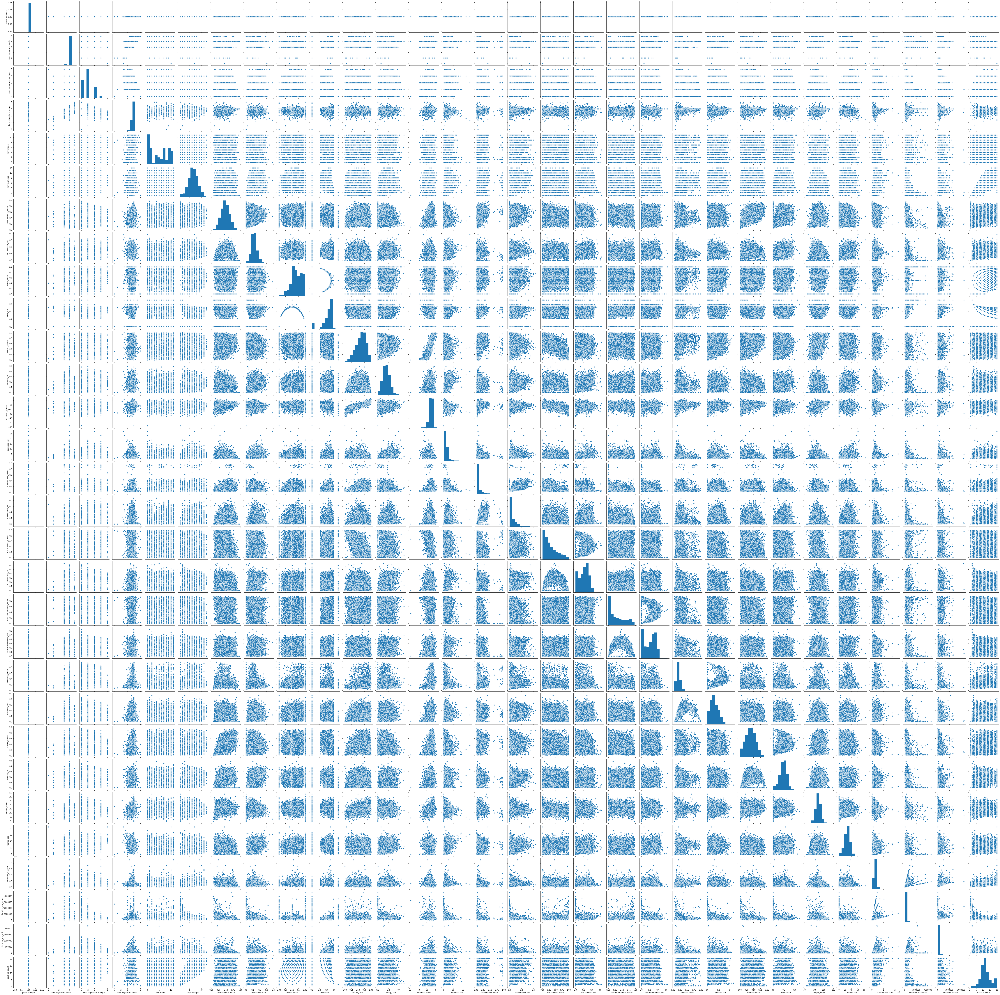

In [21]:
# visualizing distribution of features

sns.pairplot(df)

In [22]:
df.describe()

,genre_nunique,time_signature_mode,time_signature_nunique,time_signature_mean,key_mode,key_nunique,danceability_mean,danceability_std,mode_mean,mode_std,...,liveness_mean,liveness_std,valence_mean,valence_std,tempo_mean,tempo_std,duration_ms_sum,duration_ms_mean,duration_ms_std,track_id_count
count,14080.0,14080.000000,14080.000000,14080.000000,14080.000000,14080.000000,14080.000000,14080.000000,14080.000000,14080.000000,...,14080.000000,14080.000000,14080.000000,14080.000000,14080.000000,14080.000000,1.408000e+04,1.408000e+04,1.408000e+04,14080.000000
mean,1.0,3.972301,1.968821,3.862082,4.951207,6.521378,0.480661,0.121390,0.665700,0.424485,...,0.202143,0.126830,0.398791,0.185932,120.447147,26.535381,2.886540e+06,2.681957e+05,8.475677e+04,11.824503
std,0.0,0.187544,0.811493,0.199457,3.662162,1.814925,0.146243,0.043232,0.204179,0.141303,...,0.096015,0.069066,0.178028,0.067122,13.090983,9.228590,1.062278e+06,1.843063e+05,8.502384e+04,3.919201
min,1.0,0.000000,1.000000,1.000000,0.000000,1.000000,0.060800,0.000000,0.000000,0.000000,...,0.037700,0.000000,0.014600,0.000000,57.592000,0.000000,2.210000e+04,2.210000e+04,0.000000e+00,1.000000
25%,1.0,4.000000,1.000000,3.777778,1.000000,5.000000,0.381267,0.092989,0.538462,0.403113,...,0.142670,0.077709,0.268571,0.145994,112.212792,21.012731,2.296000e+06,2.019467e+05,4.521821e+04,10.000000
50%,1.0,4.000000,2.000000,3.916667,5.000000,7.000000,0.480809,0.118449,0.666667,0.483046,...,0.180144,0.115491,0.398917,0.190644,120.575013,27.045117,2.674239e+06,2.357640e+05,6.443539e+04,11.000000
75%,1.0,4.000000,2.000000,4.000000,9.000000,8.000000,0.582325,0.146179,0.818182,0.513553,...,0.234671,0.173936,0.525632,0.232043,128.635392,32.524010,3.319279e+06,2.817452e+05,9.447218e+04,14.000000
max,1.0,5.000000,5.000000,5.000000,11.000000,12.000000,0.958000,0.382559,1.000000,0.707107,...,0.976000,0.457811,0.964000,0.484487,193.244000,84.098739,2.289121e+07,4.528587e+06,2.238399e+06,20.000000


**Takeaways from initial look at song features across all albums:**

*genre_nunique*: Meaningless. Will drop.  

*time_signature_mode*: Most albums have 1-2 time signatures, total, some 3-4. 

*time_signature_nunique*: Nearly all albums are primarily in 4/4.  

*time_signature_mean*: Most albums have a couple/few songs in 3/4

*key_mode*: Aggregated value across all records not insightful, but would be interesting to see if there is correlation between any particular key and critical reception. Distribution is not uniform. 

*key_nunique*: Most albums span 6-7 keys. May be interesting to make new feature that divides key_nunique by track_id_count  

*duration_ms_sum*: The longest albums are nearly 10x longer than the average album length. Distribution skewed heavily to the right. 

*tempo_std*: 120bpm is considered the pop golden standard and is the average tempo across all the albums. 

*track_id_count*: Albums average 12 songs but range from 1-20. 

Most measures of sonic quality (danceability, liveness, speechiness, etc.) are relatively in the middle on average and their ranges and distributions pass a gut check. Two interesting, although perpahs unsurprising, initial ovservations are that mode tends to be in the major key and valence tends to be on the happy side. 